<center><h1> Clarence Barron Hand Written Number Recognition Report</h1></center>

# Introduction

With the use of Machine Learning using Convolutional Neural Network (CNN), this project is to demonstrate how to use the neural network system to identify hand written numbers that are written on a sheet of paper. Also, to do this, we used a Raspberry Pi 4 and a camera to help us identify these numbers through training using the MNIST data that was provided within the keras library.

# Theory

The theory behind this project is to see how well the neural network can detect different numbers by training. With the use of layers and training the model using Keras, we want to understand how robust the model is in telling the numbers from each other. With the use of multiple hidden layers using the "relu" function and ending with "softmax". It can help get our prediction matrix for each number. Then with the tools used with the NumPy library, we can actually use that prediction matrix to have classes. To that end, this will help us along with the tools of the OpenCV library to use our camera to feed the model with the correct information to predict and display the theory upon the Raspberry Pi Sense Hat module.

# Procedure and Design

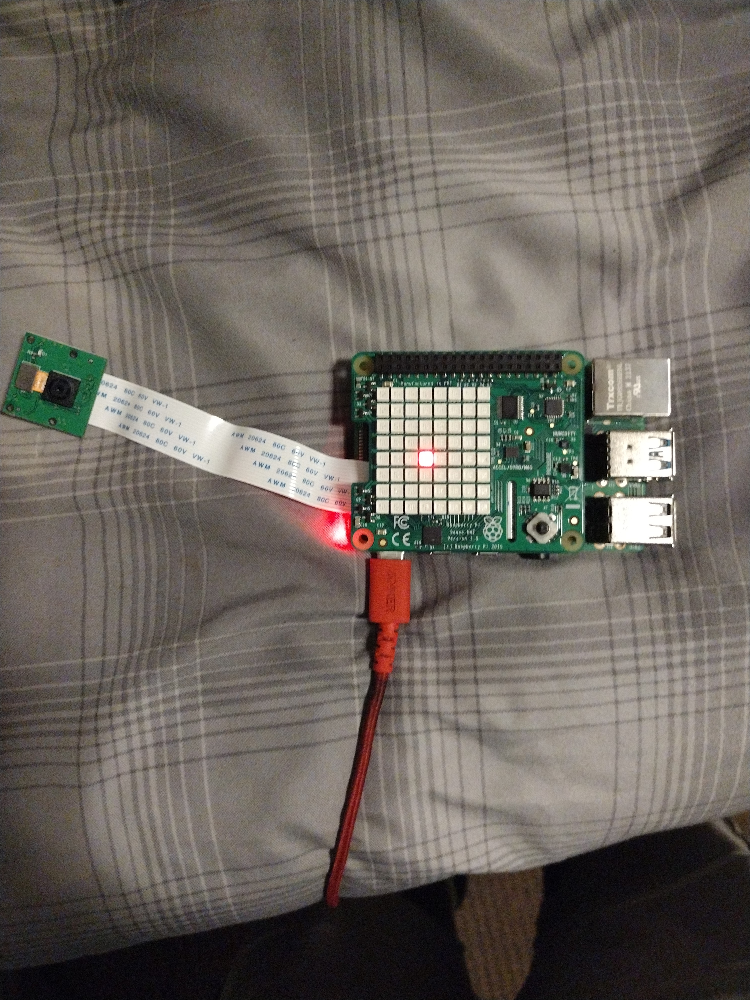

The setup for this procedure is not too complicated as all we need is the Sense Hat module and the Raspberry Pi set up. Outside of that, there is no real set up, the use of our system will be simple.

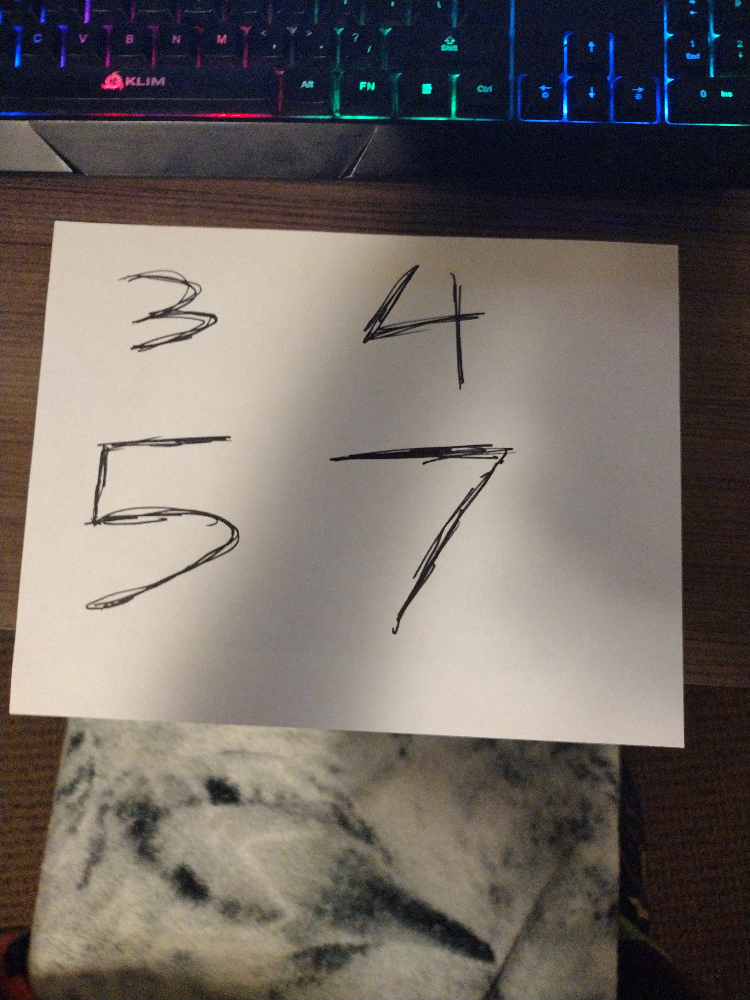

As far as the set up for the numbers, it was the classic paper on desk. The area in the room is not large enough for a bigger sort of set up, but it is fine. However, I will note that in the video, the setup is a little bit different as I recorded it inside of a friend's room due to my dorm having insufficient lighting for the camera to pick up the numbers correctly. That aside, the set up is the exact same both here and in the video as well.

### Photo Creation

As far as procedure go, first thing was to get the camera to work with the Pi in the same orientation as the MNIST numbers from the Keras Library. To do so, first I would have to get an image to come out in that orientation first, and it was achieved with the use of the following code:

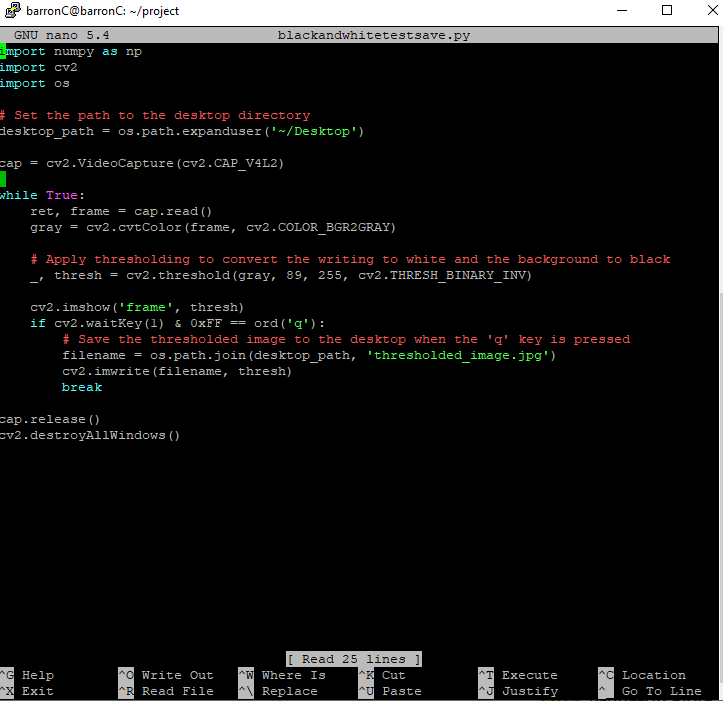

After executing this code on one number on a sheet of paper. I have recieved the following:

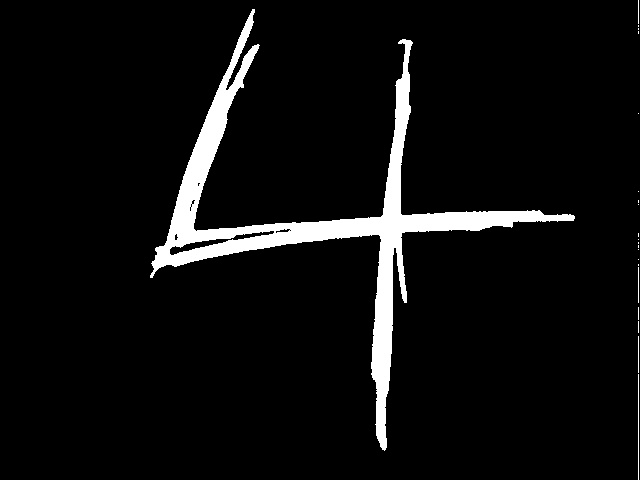

After verifying that the code can display the image, I then swapped to my machine to test the model and fix it to where it can tell what number it was by feeding the number 4 as seen above to see if it can classify it correctly.

In [1]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
import os, cv2, itertools

The following code is from https://keras.io/examples/vision/mnist_convnet/ so we can use this code to get our data and training model to test the image.

In [2]:
num_classes = 10
input_shape = (28, 28, 1)


(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()
x_train = x_train.astype("float32") / 255
x_test = x_test.astype("float32") / 255

x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)
print("x_train shape:", x_train.shape)
print(x_train.shape[0], "train samples")
print(x_test.shape[0], "test samples")



y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


In [3]:
model = keras.Sequential(
    [
        keras.Input(shape=input_shape),
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(128, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation="softmax"),
    ]
)

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 3, 3, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 1, 1, 128)        0

In [4]:
batch_size = 128
epochs = 15

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.1)

Epoch 1/15
422/422 [==============================] - 14s 33ms/step - loss: 0.4858 - accuracy: 0.8495 - val_loss: 0.0979 - val_accuracy: 0.9717
Epoch 2/15
422/422 [==============================] - 14s 33ms/step - loss: 0.1647 - accuracy: 0.9509 - val_loss: 0.0708 - val_accuracy: 0.9785
Epoch 3/15
422/422 [==============================] - 14s 33ms/step - loss: 0.1248 - accuracy: 0.9627 - val_loss: 0.0557 - val_accuracy: 0.9837
Epoch 4/15
422/422 [==============================] - 14s 33ms/step - loss: 0.1052 - accuracy: 0.9684 - val_loss: 0.0486 - val_accuracy: 0.9847
Epoch 5/15
422/422 [==============================] - 14s 33ms/step - loss: 0.0916 - accuracy: 0.9730 - val_loss: 0.0436 - val_accuracy: 0.9872
Epoch 6/15
422/422 [==============================] - 14s 33ms/step - loss: 0.0793 - accuracy: 0.9764 - val_loss: 0.0417 - val_accuracy: 0.9867
Epoch 7/15
422/422 [==============================] - 14s 33ms/step - loss: 0.0721 - accuracy: 0.9776 - val_loss: 0.0445 - val_accuracy:

In [5]:
score = model.evaluate(x_test, y_test, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 0.03976299613714218
Test accuracy: 0.989300012588501


After verifying training, we can now test the image to see if the code works. Using the OpenCV library, we can do the post processing by using the image and resizing it.

In [6]:
img = cv2.imread(r'C:\Users\c3myb\OneDrive\Pictures\PictureForNN\thresholded_image2.jpg', cv2.IMREAD_GRAYSCALE)

In [7]:
img_resized = cv2.resize(img, (28, 28))

We must also normalize the image by dividing it by 255.0 after changing it to a float32 number. This will help us feed the model by fitting the image as the model was trained with.

In [8]:
img_norm = img_resized.astype('float32') / 255.0

In [9]:
img_reshaped = img_norm.reshape((1, 28, 28, 1))

In [10]:
prediction = model.predict(img_reshaped)

1/1 [==============================] - 0s 89ms/step


With the use of np.argmax, we can use the prediction array to get the number that was fed into the model along with the confidence value. To verify, we can print the prediction matrix as well to see if the if argmax did what it was suppose to do. np.argmax() is suppose to return the largest value in the array, in this case it is 4.13e-08, which is the larges number. Hence, it will return 4. Along with the confidence rate returning with a 99.99%.

In [11]:
pred_class = np.argmax(prediction)
confidence = prediction[0][pred_class] * 100
print(f"Predicted class: {pred_class}, Confidence: {confidence:.2f}%")

Predicted class: 4, Confidence: 99.99%


In [12]:
print(prediction)

[[1.02420544e-10 1.80383822e-07 1.86026341e-08 1.05598377e-10
  9.99914408e-01 1.40530105e-07 4.13393408e-08 2.44270012e-07
  1.15581915e-05 7.33413108e-05]]


After training and testing the model, we have to intergrate the three parts together onto the RaspberryPi, after transfering the code onto the Pi, the resulting code is this:

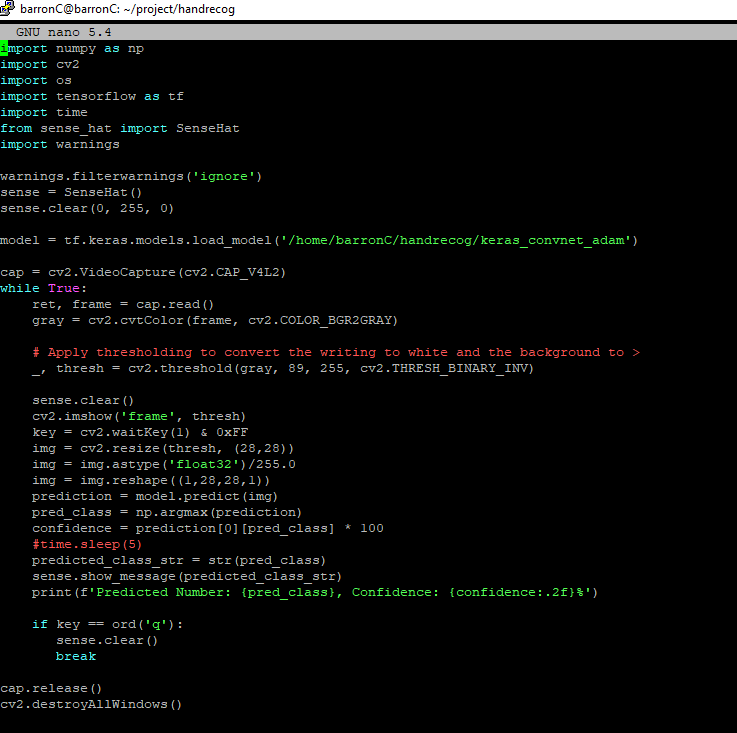

# Data And Analaysis

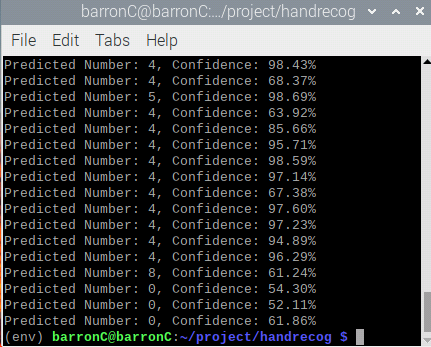

As far as our data, the data comes back as what we want showing the different confidence levels. As seen in the video as well the network is very sensitive as well. The reason that it does read the wrong number from time to time is that I am a very shaky person when it comes to holding things. However, after standing still, the number 4 is read along with its confidence levels. Hence, this does confirm our theory when it comes to CNN and number recognition using hand writing and does a really good job at displaying that feat.

# Conclusion and Final Thoughts

Overall, this project was not too bad. I had a lot of fun putting this together, and this was one of the best projects I have ever worked on. Honestly, I would have loved to do more with the raspberry pi in this manner as well. The CNN also really shows how interesting it can be with traning and displaying numbers. It is an extremely powerful tool that we can use, and I hope to use this more even further beyond college.

# Proof Of Installation: 

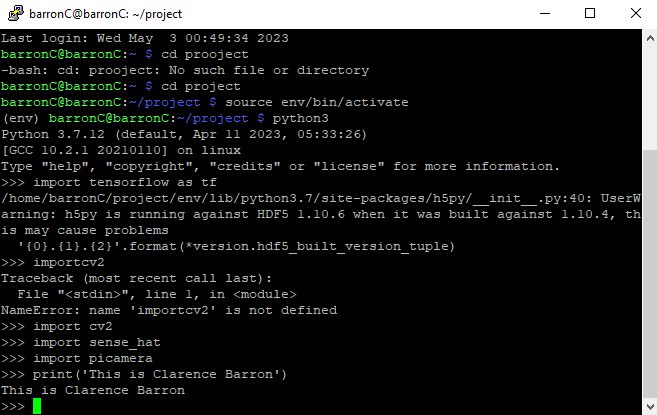

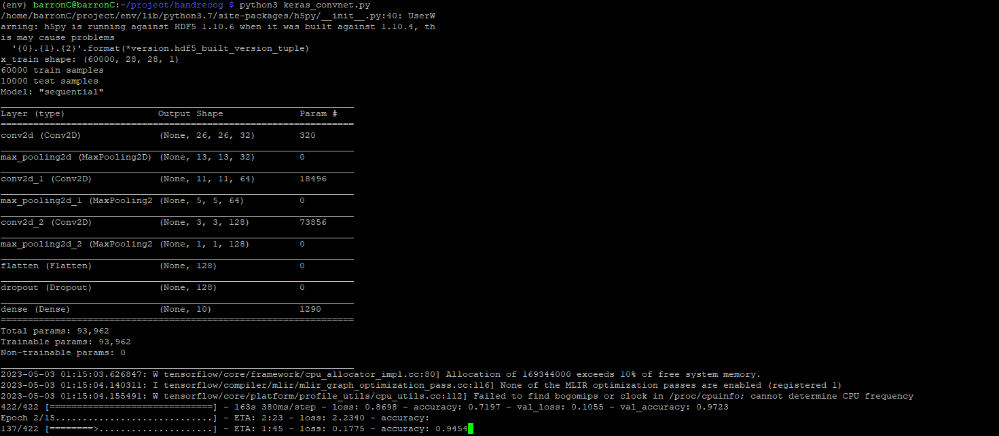